In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from tasks.game24 import Game24Task

game24 = Game24Task()
train_list, test_list = game24._sample_data(0, 1362)
print(len(train_list), len(test_list))
for i in range(5):
    print(train_list[i])
    print(test_list[i])

Update success: c:\Users\Administrator\Desktop\LLM\O1-24\src\..\data\24\24.csv
300 100
0
12
6
34
11
40
15
49
17
66


In [3]:
for i in (train_list, test_list):
    print(i)

[0, 6, 11, 15, 17, 18, 21, 26, 27, 28, 31, 33, 38, 42, 46, 55, 56, 57, 63, 70, 74, 75, 76, 77, 78, 79, 81, 86, 87, 90, 93, 95, 103, 105, 108, 120, 131, 132, 139, 142, 144, 151, 161, 170, 175, 179, 183, 184, 196, 197, 213, 216, 220, 223, 237, 257, 259, 261, 284, 286, 287, 289, 290, 296, 298, 300, 311, 313, 316, 323, 331, 336, 346, 347, 355, 356, 362, 369, 376, 379, 385, 389, 390, 392, 393, 395, 402, 405, 415, 424, 426, 427, 433, 440, 441, 442, 445, 446, 449, 453, 459, 461, 462, 463, 469, 470, 474, 478, 482, 485, 488, 493, 495, 496, 497, 502, 507, 513, 518, 523, 524, 525, 526, 527, 528, 529, 532, 534, 537, 543, 546, 560, 566, 568, 574, 578, 580, 586, 591, 607, 608, 609, 612, 618, 636, 642, 646, 653, 665, 672, 679, 684, 686, 695, 696, 699, 704, 706, 711, 715, 724, 725, 730, 734, 735, 741, 744, 746, 750, 751, 752, 763, 766, 767, 773, 774, 779, 794, 803, 804, 832, 834, 843, 845, 847, 848, 861, 862, 870, 873, 874, 877, 885, 891, 893, 895, 896, 902, 904, 906, 915, 916, 919, 922, 924, 927, 928

In [14]:
import re
q = "1 2 3 4"
print(list(map(float, re.findall(r'\d+', q))))

[1.0, 2.0, 3.0, 4.0]


In [15]:
value_prompt = """
4 + 4 + 10 = 18. Not enough. Maybe (10 - 4) * 4 = 24. Yes, that works! 
Sure.
"""
content = value_prompt.split('\n')
last_line = content[-1]
eval_val = None
print([text + '\n' for text in content])

['\n', '4 + 4 + 10 = 18. Not enough. Maybe (10 - 4) * 4 = 24. Yes, that works! \n', 'Sure.\n', '\n']


In [1]:
from src.algorithm import get_proposals
from src.evaluator import Evaluator
from tasks.game24 import Game24Task

train_list = [0, 6, 11]
game = Game24Task()
evaluator = Evaluator()
q = game.get_input(train_list[0])
print(q)
proposals = get_proposals(evaluator, game, q, '')
print("OK!")
print(proposals)

SyntaxError: expected ':' (algorithm.py, line 45)

In [13]:
# proposals = proposals.split('\n')
new_proposals = [_ for _ in proposals]
del_num = []
left_num = []
for i, step in enumerate(new_proposals):
    print(f"the i step: {step}")
    del_num.append(step.split('(')[0])
    left_num.append(step.split('(')[1].split(')')[0])
    print(f"the del_num step: {del_num[i]}")
    print(f"the left_num step: {left_num[i]}")

the i step: 1 + 1 = 2 (left: 2 11 11)  
the del_num step: 1 + 1 = 2 
the left_num step: left: 2 11 11
the i step: 11 - 1 = 10 (left: 1 10 11)  
the del_num step: 11 - 1 = 10 
the left_num step: left: 1 10 11
the i step: 11 / 1 = 11 (left: 1 11 11)  
the del_num step: 11 / 1 = 11 
the left_num step: left: 1 11 11
the i step: 11 * 1 = 11 (left: 1 11 11)  
the del_num step: 11 * 1 = 11 
the left_num step: left: 1 11 11
the i step: 11 + 1 = 12 (left: 1 11 12)  
the del_num step: 11 + 1 = 12 
the left_num step: left: 1 11 12
the i step: 11 - 11 = 0 (left: 0 1 1)  
the del_num step: 11 - 11 = 0 
the left_num step: left: 0 1 1
the i step: 1 * 11 = 11 (left: 1 11 11)  
the del_num step: 1 * 11 = 11 
the left_num step: left: 1 11 11
the i step: 11 + 11 = 22 (left: 1 1 22)
the del_num step: 11 + 11 = 22 
the left_num step: left: 1 1 22


In [ ]:
"""获取数据"""
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('24.csv')
df_sorted = df.sort_values(by='Solved rate')

n_layers = 3
df_sorted['layer'] = pd.qcut(df_sorted.index, q=n_layers, labels=False)
layer_counts = df_sorted['layer'].value_counts().sort_index()

train_size = 300
test_size = 100
total_needed = train_size + test_size

# 按比例抽取样本
train_samples_per_layer = (layer_counts * train_size / len(df_sorted)).round().astype(int)
test_samples_per_layer = (layer_counts * test_size / len(df_sorted)).round().astype(int)
test_samples_per_layer[n_layers-1] += test_size - test_samples_per_layer.sum()

train_indices = []
test_indices = []
for layer in range(n_layers):
    layer_data = df_sorted[df_sorted['layer'] == layer]
    train_to_take = train_samples_per_layer[layer]
    test_to_take = test_samples_per_layer[layer]
    print(f"Layer {layer}: {train_to_take} train samples, {test_to_take} test samples")
    train_subset = layer_data.sample(n=train_to_take, random_state=42)
    test_subset = layer_data.drop(train_subset.index).sample(n=test_to_take, random_state=42)
    train_indices.extend(train_subset.index)
    test_indices.extend(test_subset.index)

# 获取训练集和测试集
train_set = df_sorted.loc[train_indices].reset_index(drop=True)
test_set = df_sorted.loc[test_indices].reset_index(drop=True)

train_set = train_set.drop(columns=['Rank', 'AMT (s)', 'Solved rate', '1-sigma Mean (s)', '1-sigma STD (s)'])
test_set = test_set.drop(columns=['Rank', 'AMT (s)', 'Solved rate', '1-sigma Mean (s)', '1-sigma STD (s)'])


"""
添加负样本
"""
import random
from itertools import permutations, product

def is_not_solvable(numbers):
    result = solve_24_with_steps(numbers)
    if result == "No solution":
        return True
    return False

def generate_negative_samples(count=100):
    """
    生成指定数量的负样本。
    """
    negative_samples = []
    while len(negative_samples) < count:
        numbers = [random.randint(1, 13) for _ in range(4)]
        if is_not_solvable(numbers):
            negative_samples.append(numbers)
            print(f"Generated negative sample {len(negative_samples)}: {numbers}")
    return negative_samples

# 生成 100, 50 个负样本
negative_samples_train = generate_negative_samples(100)
train_negative_df = pd.DataFrame({'Puzzles': negative_samples_train})
train_negative_df['Puzzles'] = train_negative_df['Puzzles'].apply(lambda x: ' '.join(map(str, x)))
train_set = pd.concat([train_set, train_negative_df], ignore_index=True)

negative_samples_test = generate_negative_samples(50)
test_negative_df = pd.DataFrame({'Puzzles': negative_samples_test})
test_negative_df['Puzzles'] = test_negative_df['Puzzles'].apply(lambda x: ' '.join(map(str, x)))
test_set = pd.concat([test_set, test_negative_df], ignore_index=True)

train_set.to_csv('train.csv', index=True)
test_set.to_csv('test.csv', index=True)
train_puzzles = train_set['Puzzles'].tolist()
test_puzzles = test_set['Puzzles'].tolist()
# train_puzzles_sorted = sorted(train_puzzles)  # 原始数据的四个数字数据已经提前排序

overlap = []
flag = False
for puzzle in train_puzzles:
    if puzzle in test_puzzles:
        overlap.append(puzzle)
        flag = True
if flag:
    print('训练集和测试集有重叠样本！', len(overlap))
    for laps in overlap:
        test_set = test_set[test_set['Puzzles'] != laps]
    test_set.to_csv('test.csv', index=True)
else:
    print('训练集和测试集没有重叠样本！')

Layer 0: 100 train samples, 33 test samples
Layer 1: 100 train samples, 33 test samples
Layer 2: 100 train samples, 34 test samples
Try:7+6=13.00,Rest:[4, 10, 13]
Try:7-6=1.00,Rest:[1, 4, 10]
Try:6-7=-1.00,Rest:[-1, 4, 10]
Try:7*6=42.00,Rest:[4, 10, 42]
Try:7/6=1.17,Rest:[1.17, 4, 10]
Try:6/7=0.86,Rest:[0.86, 4, 10]
Try:7+4=11.00,Rest:[6, 10, 11]
Try:7-4=3.00,Rest:[3, 6, 10]
Try:4-7=-3.00,Rest:[-3, 6, 10]
Try:7*4=28.00,Rest:[6, 10, 28]
Try:7/4=1.75,Rest:[1.75, 6, 10]
Try:4/7=0.57,Rest:[0.57, 6, 10]
Try:7+10=17.00,Rest:[4, 6, 17]
Try:7-10=-3.00,Rest:[-3, 4, 6]
Try:10-7=3.00,Rest:[3, 4, 6]
Try:7*10=70.00,Rest:[4, 6, 70]
Try:7/10=0.70,Rest:[0.7, 4, 6]
Try:10/7=1.43,Rest:[1.43, 4, 6]
Try:6+4=10.00,Rest:[7, 10, 10]
Try:6-4=2.00,Rest:[2, 7, 10]
Try:4-6=-2.00,Rest:[-2, 7, 10]
Try:6*4=24.00,Rest:[7, 10, 24]
Try:6/4=1.50,Rest:[1.5, 7, 10]
Try:4/6=0.67,Rest:[0.67, 7, 10]
Try:6+10=16.00,Rest:[4, 7, 16]
Try:6-10=-4.00,Rest:[-4, 4, 7]
Try:10-6=4.00,Rest:[4, 4, 7]
Try:6*10=60.00,Rest:[4, 7, 60]
Try:

In [2]:
from transformers import AutoTokenizer, AutoModelForCausalLM

model = AutoModelForCausalLM.from_pretrained(
    "Qwen/Qwen2.5-0.5B-Instruct",
    trust_remote_code=True,
    cache_dir="./Qwen2.5-0.5n-Instruct/cache"
)
tokenizer = AutoTokenizer.from_pretrained(
    "Qwen/Qwen2.5-0.5B-Instruct",
    trust_remote_code=True,
    cache_dir="./Qwen2.5-0.5n-Instruct/cache"
)
print("已加载模型和分词器！")

已加载模型和分词器！


In [3]:
from transformers import AutoModelForCausalLM, AutoTokenizer

prompt = "Given the numbers [9, 10, 12, 13], use arithmetic operations (+, -, *, /) and parentheses to create an expression that equals 24. Each number must be used exactly once."
messages = [
    {"role": "system", "content": "Input: 4, 6, 8, 10.Possible next steps:4+6 = 10 (left: 10, 8, 10)\n8-4 = 4 (left 4, 6, 10)\n10+4 = 14 (left: 14, 6, 8)Input: 9 10 12 13.Possible next steps:"},
    {"role": "user", "content": prompt}
]
text = tokenizer.apply_chat_template(
    messages,
    tokenize=False,
    add_generation_prompt=True
)
model_inputs = tokenizer([text], return_tensors="pt").to(model.device)

generated_ids = model.generate(
    **model_inputs,
    max_new_tokens=4096,
)
generated_ids = [
    output_ids[len(input_ids):] for input_ids, output_ids in zip(model_inputs.input_ids, generated_ids)
]

response = tokenizer.batch_decode(generated_ids, skip_special_tokens=True)[0]
response

"To achieve the target of getting a sum of 24 using the given numbers in order without any parenthesis or additional operations like multiplication and division by zero, you can use these numbers as follows:\n\n\\[ \\frac{10}{3} + 7 + 5 = 24 \\]\n\nHere's how it works:\n1. Divide 10 by 3 to get 3.\n2. Add 7 to this result, which gives 10.\n3. Finally, add 5 to reach the desired total.\n\nSo, \\( \\frac{10}{3} + 7 + 5 = 24 \\)."

In [ ]:
"""生成数据"""
import pandas as pd
import io
import sys
import json
from typing import List, Dict, Union
from contextlib import redirect_stdout
from rejected_sampling import generate_enhanced_solution
from transformers import AutoTokenizer, AutoModelForCausalLM
import random


model_path = r"C:\Users\Administrator\Desktop\LLM\O1-24\Qwen2.5-0.5b\models--Qwen--Qwen2.5-0.5B\snapshots\060db6499f32faf8b98477b0a26969ef7d8b9987"
tokenizer = AutoTokenizer.from_pretrained(model_path, trust_remote_code=True)
model = AutoModelForCausalLM.from_pretrained(model_path, trust_remote_code=True)

def read_puzzles(file_path: str) -> List[str]:
    df = pd.read_csv(file_path)
    puzzles = df['Puzzles'].tolist()
    return puzzles

def solve_and_capture(numbers_str: str) -> Dict[str, Union[str, List[str]]]:
    numbers = list(map(int, numbers_str.split()))
    return generate_enhanced_solution(numbers, solve_24_with_steps, tokenizer)

def save_data(data: List[Dict[str, Union[str, List[str]]]], file_path: str):
    with open(file_path, 'w', encoding='utf-8') as f:
        json.dump(data, f, ensure_ascii=False, indent=4)

def main():
    train_puzzles = read_puzzles('train.csv')
    test_puzzles = read_puzzles('test.csv')

    train_data = []
    for puzzle in train_puzzles:
        data_point = solve_and_capture(puzzle)
        train_data.append(data_point)

    train_data_sorted = sorted(train_data, key=lambda x: x['tokens'])

    test_data = []
    for puzzle in test_puzzles:
        data_point = solve_and_capture(puzzle)
        test_data.append(data_point)

    test_data_sorted = sorted(test_data, key=lambda x: x['tokens'])
    save_data(train_data_sorted, 'train_data.json')
    save_data(test_data_sorted, 'test_data.json')

if __name__ == "__main__":
    main()

c:\ProgramData\miniconda3\envs\lora_env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
"""构建数据集"""
import json

train_data = json.load(open('train_data.json', 'r', encoding='utf-8'))
validate_data = json.load(open('test_data.json', 'r', encoding='utf-8'))

train_dataset = []
validation_dataset = []

for data_point in train_data:
    outputs= (
        f"<|begin_of_thought|>\n\n{data_point['thought_process']}<|end_of_thought|>\n\n"
        f"<|begin_of_solution|>\n\n{data_point['solution']}\n{data_point['explanation']}<|end_of_solution|>"
    )
    train_data_point = {
        "instruction": "Your role as an assistant involves thoroughly exploring questions through a systematic long thinking process before providing the final precise and accurate solutions. This requires engaging in a comprehensive cycle of analysis, summarizing, exploration, reassessment, reflection, backtracing, and iteration to develop well-considered thinking process. Please structure your response into two main sections: Thought and Solution. In the Thought section, detail your reasoning process using the specified format: <|begin_of_thought|> {thought with steps separated with ' '} <|end_of_thought|> Each step should include detailed considerations such as analysing questions, summarizing relevant findings, brainstorming new ideas, verifying the accuracy of the current steps, refining any errors, and revisiting previous steps. In the Solution section, based on various attempts, explorations, and reflections from the Thought section, systematically present the final solution that you deem correct. The solution should remain a logical, accurate, concise expression style and detail necessary step needed to reach the conclusion, formatted as follows: <|begin_of_solution|> {final formatted, precise, and clear solution} <|end_of_solution|> Now, try to solve the following question through the above guidelines:",
        "input": data_point["question"],
        "output": (
            f"<|begin_of_thought|>\n\n{data_point['thought_process']}<|end_of_thought|>\n\n"
            f"<|begin_of_solution|>\n\n{data_point['solution']}\n{data_point['explanation']}<|end_of_solution|>"
        ),
        "tokens": len(tokenizer(outputs)["input_ids"])
    }
    train_dataset.append(train_data_point)
for data_point in validate_data:
    outputs= (
        f"<|begin_of_thought|>\n\n{data_point['thought_process']}<|end_of_thought|>\n\n"
        f"<|begin_of_solution|>\n\n{data_point['solution']}\n{data_point['explanation']}<|end_of_solution|>"
    )
    validation_data_point = {
        "instruction": "Your role as an assistant involves thoroughly exploring questions through a systematic long thinking process before providing the final precise and accurate solutions. This requires engaging in a comprehensive cycle of analysis, summarizing, exploration, reassessment, reflection, backtracing, and iteration to develop well-considered thinking process. Please structure your response into two main sections: Thought and Solution. In the Thought section, detail your reasoning process using the specified format: <|begin_of_thought|> {thought with steps separated with ' '} <|end_of_thought|> Each step should include detailed considerations such as analysing questions, summarizing relevant findings, brainstorming new ideas, verifying the accuracy of the current steps, refining any errors, and revisiting previous steps. In the Solution section, based on various attempts, explorations, and reflections from the Thought section, systematically present the final solution that you deem correct. The solution should remain a logical, accurate, concise expression style and detail necessary step needed to reach the conclusion, formatted as follows: <|begin_of_solution|> {final formatted, precise, and clear solution} <|end_of_solution|> Now, try to solve the following question through the above guidelines:",
        "input": data_point["question"],
        "output": (
            f"<|begin_of_thought|>\n\n{data_point['thought_process']}<|end_of_thought|>\n\n"
            f"<|begin_of_solution|>\n\n{data_point['solution']}\n{data_point['explanation']}<|end_of_solution|>"
        ),
        "tokens": len(tokenizer(outputs)["input_ids"])
    }
    validation_dataset.append(validation_data_point)

# 保存数据集
with open('train_dataset.json', 'w', encoding='utf-8') as f:
    json.dump(train_dataset, f, ensure_ascii=False, indent=4)
with open('validation_dataset.json', 'w', encoding='utf-8') as f:
    json.dump(validation_dataset, f, ensure_ascii=False, indent=4)

print("训练集和验证集构建完成")

训练集和验证集构建完成


In [ ]:
import json

with open('train_data.json', 'r') as f:
    train_data = json.load(f)
len(train_data)

400

In [ ]:
import json

train_data = json.load(open('train_data.json', 'r', encoding='utf-8'))
validate_data = json.load(open('test_data.json', 'r', encoding='utf-8'))
train_cnt = 0
validate_cnt = 0
negative_train_cnt = 0
negative_validate_cnt = 0
for data in train_data:
    train_cnt += 1
    if train_cnt > 100:
        print(data['tokens'])
        break
for data in validate_data:
    validate_cnt += 1
    if validate_cnt > 100:
        print(data['tokens'])
        break
negative_train_list, negative_validate_list = [], []
for i in range(4):
    for data in train_data[100*i:100*(i+1)]:
        if "No solution found" in data['explanation']:
            negative_train_cnt += 1
    negative_train_list.append(negative_train_cnt)
    negative_train_cnt = 0

    for data in validate_data[100*i:100*(i+1)]:
        if "No solution found" in data['explanation']:
            negative_validate_cnt += 1
    negative_validate_list.append(negative_validate_cnt)
    negative_validate_cnt = 0
print(negative_train_list, negative_validate_list)

615
752
[56, 21, 18, 5] [43, 7, 0, 0]


931
913
total train data tokens: 278491
total validation data tokens: 104045


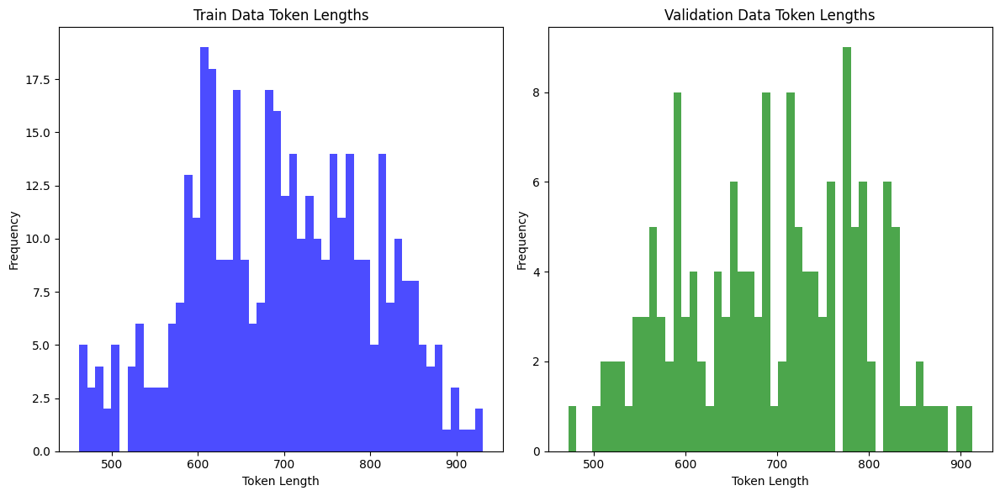

In [ ]:
import json
import matplotlib.pyplot as plt

train_data = json.load(open("train_data.json", "r", encoding='utf-8'))
validation_data = json.load(open("test_data.json", "r", encoding='utf-8'))
train_data_length = [data_length['tokens'] for data_length in train_data]
validation_data_length = [data_length['tokens'] for data_length in validation_data]
print(train_data[-1]['tokens'])
print(validation_data[-1]['tokens'])
print(f"total train data tokens: {sum(train_data_length)}")
print(f"total validation data tokens: {sum(validation_data_length)}")
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(train_data_length, bins=50, color='blue', alpha=0.7)
plt.title('Train Data Token Lengths')
plt.xlabel('Token Length')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(validation_data_length, bins=50, color='green', alpha=0.7)
plt.title('Validation Data Token Lengths')
plt.xlabel('Token Length')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [ ]:
import json

train_data = json.load(open('train_data.json', 'r', encoding='utf-8'))
validate_data = json.load(open('test_data.json', 'r', encoding='utf-8'))
negative_train_cnt = 0
negative_validate_cnt = 0
for data in train_data[:50]:
    if "No solution found" in data['explanation']:
        negative_train_cnt += 1
for data in validate_data[:25]:
    if "No solution found" in data['explanation']:
        negative_validate_cnt += 1
print(negative_train_cnt, negative_validate_cnt)
print(train_data[50]['tokens'], validate_data[25]['tokens'])

9 8
4267 4364


In [5]:
!python3 /content/drive/MyDrive/O1-24/train.py

2025-01-23 12:26:49.010042: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-23 12:26:49.030757: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-23 12:26:49.037158: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-23 12:26:50.096601: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
The model was loaded with use_flash_attention_2=True, which is deprecated and may be removed in a future release. Please use `attn_implementation="flash_attention_2"` instead.
  0% 0/1000 [00:00<?, ?it/s]You're using a Qwen2TokenizerFast tok

In [ ]:
!pip install datasets flash_attn bitsandbytes